In [1]:
import os
import urllib.request
import tarfile
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import requests
from tqdm import tqdm
import glob


# Using LFW Dataset to test 

LFW Dataset: https://www.kaggle.com/datasets/jessicali9530/lfw-dataset

Deepface also used LFW Dataset for benchmarking their model accuracy-wise so here I am testing their efficiency 

In [2]:
class LFWDatasetSetup:
    def __init__(self):
        self.base_dir = 'data/lfw'
        self.images_dir = 'data/lfw/lfw-deepfunneled'
            
    def scan_images(self):
        """Scan and catalog all images without creating artificial annotations"""
        if not os.path.exists(self.images_dir):
            print("❌ Images directory not found. Please extract dataset first.")
            return None
        
        print("🔍 Scanning images...")
        
        # Find all JPEG images
        image_paths = []
        for root, dirs, files in os.walk(self.images_dir):
            for file in files:
                if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    full_path = os.path.join(root, file)
                    relative_path = os.path.relpath(full_path, self.images_dir)
                    image_paths.append(relative_path)
        
        print(f"✅ Found {len(image_paths)} images")
        
        # Just create a simple dictionary mapping image paths to empty lists
        # This maintains compatibility with the test code that expects a dictionary
        image_dict = {img_path: [] for img_path in image_paths}
        
        return image_dict
    
    def visualize_samples(self, image_dict, num_samples=6):
        """Visualize sample images without bounding boxes"""
        if not image_dict:
            print("❌ No images to visualize")
            return
        
        sample_images = list(image_dict.keys())[:num_samples]
        
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()
        
        for idx, img_path in enumerate(sample_images):
            full_img_path = os.path.join(self.images_dir, img_path)
            
            if os.path.exists(full_img_path):
                img = cv2.imread(full_img_path)
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                
                axes[idx].imshow(img_rgb)
                axes[idx].set_title(f'Image {idx+1}')
                axes[idx].axis('off')
            else:
                axes[idx].text(0.5, 0.5, 'Image not found', ha='center', va='center')
                axes[idx].set_title('Missing')
        
        plt.suptitle('LFW Dataset Sample Images')
        plt.tight_layout()
        plt.show()
    
    def create_test_split(self, image_dict, test_ratio=0.2):
        """Split images into train and test sets"""
        image_paths = list(image_dict.keys())
        np.random.shuffle(image_paths)
        
        split_idx = int(len(image_paths) * (1 - test_ratio))
        train_paths = image_paths[:split_idx]
        test_paths = image_paths[split_idx:]
        
        train_dict = {path: [] for path in train_paths}
        test_dict = {path: [] for path in test_paths}
        
        print(f"📊 Dataset split:")
        print(f"  Training images: {len(train_dict)}")
        print(f"  Testing images: {len(test_dict)}")
        
        return train_dict, test_dict
    
    def get_dataset_statistics(self, image_dict):
        """Get basic dataset statistics"""
        if not image_dict:
            print("❌ No images to analyze")
            return
        
        total_images = len(image_dict)
        
        dimensions = []
        
        sample_images = list(image_dict.keys())[:100] 
        
        for img_path in sample_images:
            full_path = os.path.join(self.images_dir, img_path)
            if os.path.exists(full_path):
                img = cv2.imread(full_path)
                if img is not None:
                    h, w = img.shape[:2]
                    dimensions.append((w, h))
        
        print(f"\n📈 LFW Dataset Statistics:")
        print(f"  Total images: {total_images}")
        
        if dimensions:
            avg_w = np.mean([d[0] for d in dimensions])
            avg_h = np.mean([d[1] for d in dimensions])
            print(f"  Average image size: {avg_w:.0f} x {avg_h:.0f}")
    
    def setup_complete_dataset(self, visualize=False):
        """Complete setup process without adding artificial annotations"""
        print("🚀 Setting up LFW dataset for face detection testing...")
                        
        # Scan images
        image_dict = self.scan_images()
        if not image_dict:
            return None, None
        
        # Statistics
        self.get_dataset_statistics(image_dict)
        
        # Visualize samples
        if visualize:
            self.visualize_samples(image_dict)
        
        # Create train/test split
        train_dict, test_dict = self.create_test_split(image_dict)
        
        print("✅ LFW dataset setup complete!")
        print(f"📍 Images location: {self.images_dir}")
        
        return test_dict, self.images_dir

## Deepface Detector Class

In [3]:
import os
import cv2
import time
import numpy as np
import pandas as pd
from deepface import DeepFace
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

class DeepFaceDetectorTest:
    def __init__(self, test_annotations, images_dir):
        self.test_annotations = test_annotations
        self.images_dir = images_dir
        
        self.detectors = ["opencv", "mtcnn", "retinaface", "ssd", "yunet", "centerface"]
        self.results = {}
    
    def test_single_detector(self, detector_name, max_images=50):
        print(f"\n🔍 Testing {detector_name} detector...")
        
        results = {
            'detector': detector_name,
            'total_images': 0,
            'successful_detections': 0,
            'detection_times': [],
            'faces_detected': [],
            'errors': 0
        }
        
        test_images = list(self.test_annotations.keys())[:max_images]
        
        for idx, img_path in enumerate(test_images):
            if idx % 20 == 0:
                print(f"  Progress: {idx}/{len(test_images)} images processed")
            
            full_img_path = os.path.join(self.images_dir, img_path)
            
            if not os.path.exists(full_img_path):
                continue
                
            results['total_images'] += 1
            
            try:
                start_time = time.time()
                
                detections = DeepFace.extract_faces(
                    img_path=full_img_path,
                    detector_backend=detector_name,
                    enforce_detection=False,
                    align=False
                )
                
                detection_time = time.time() - start_time
                results['detection_times'].append(detection_time)
                results['faces_detected'].append(len(detections))
                
                if len(detections) > 0:
                    results['successful_detections'] += 1
                    
            except Exception as e:
                results['errors'] += 1
        
        avg_time = np.mean(results['detection_times']) if results['detection_times'] else 0
        success_rate = results['successful_detections'] / results['total_images'] if results['total_images'] > 0 else 0
        avg_faces = np.mean(results['faces_detected']) if results['faces_detected'] else 0
        throughput = 1.0 / avg_time if avg_time > 0 else 0 
        
        results['avg_detection_time'] = avg_time
        results['success_rate'] = success_rate
        results['avg_faces_per_image'] = avg_faces
        results['throughput'] = throughput
        results['error_rate'] = results['errors'] / results['total_images'] if results['total_images'] > 0 else 0
        
        print(f"  ✅ {detector_name} completed:")
        print(f"    - Avg Detection Time: {avg_time:.3f}s")
        print(f"    - Throughput: {throughput:.2f} images/sec")
        print(f"    - Success Rate: {success_rate:.3f}")
        print(f"    - Error Rate: {results['error_rate']:.3f}")
        
        return results
    
    def test_all_detectors(self, max_images=50):
        """Test all detectors and collect results"""
        print("STARTING DEEPFACE DETECTOR PERFORMANCE TEST")
        print("="*60)
        print(f"🚀 Starting comprehensive detector testing...")
        print(f"📊 Testing on {min(max_images, len(self.test_annotations))} images")
        
        for detector in self.detectors:
            try:
                self.results[detector] = self.test_single_detector(detector, max_images)
            except Exception as e:
                print(f"❌ Failed to test {detector}: {e}")
                continue
        
        print("\n✅ All detector testing completed!")
        return self.results
    
    def create_performance_plots(self):
        """Create performance visualization focusing on speed and efficiency"""
        if not self.results:
            print("❌ No results to plot. Run test_all_detectors() first.")
            return
        
        detectors = list(self.results.keys())
        metrics_data = {
            'Detector': detectors,
            'Avg Detection Time (s)': [self.results[d]['avg_detection_time'] for d in detectors],
            'Throughput (img/sec)': [self.results[d]['throughput'] for d in detectors],
            'Success Rate': [self.results[d]['success_rate'] for d in detectors],
            'Error Rate': [self.results[d]['error_rate'] for d in detectors],
            'Avg Faces Detected': [self.results[d]['avg_faces_per_image'] for d in detectors],
        }
        
        
        # 1. Detection Speed (Bar chart)
        fig1 = go.Figure()
        fig1.add_trace(
            go.Bar(name='Avg Detection Time', x=detectors, 
                y=metrics_data['Avg Detection Time (s)'],
                marker_color='lightblue', text=metrics_data['Avg Detection Time (s)'],
                texttemplate='%{text:.3f}s', textposition='outside')
        )
        fig1.update_layout(
            title="Detection Speed Comparison",
            xaxis_title="Detector",
            yaxis_title="Time (seconds)",
            height=500,
            width=800
        )
        fig1.show()
        
        # 2. Throughput
        fig2 = go.Figure()
        fig2.add_trace(
            go.Bar(name='Throughput', x=detectors, 
                y=metrics_data['Throughput (img/sec)'],
                marker_color='lightgreen', text=metrics_data['Throughput (img/sec)'],
                texttemplate='%{text:.2f} img/s', textposition='outside')
        )
        fig2.update_layout(
            title="Throughput Comparison",
            xaxis_title="Detector",
            yaxis_title="Images per second",
            height=500,
            width=800
        )
        fig2.show()
        
        # 3. Success & Error Rates
        fig3 = go.Figure()
        fig3.add_trace(
            go.Bar(name='Success Rate', x=detectors, y=metrics_data['Success Rate'],
                marker_color='lightcoral', text=metrics_data['Success Rate'],
                texttemplate='%{text:.3f}', textposition='outside')
        )
        fig3.add_trace(
            go.Bar(name='Error Rate', x=detectors, y=metrics_data['Error Rate'],
                marker_color='gold', text=metrics_data['Error Rate'],
                texttemplate='%{text:.3f}', textposition='outside')
        )
        fig3.update_layout(
            title="Reliability Comparison",
            xaxis_title="Detector",
            yaxis_title="Rate",
            height=500,
            width=800,
            barmode='group',  
            legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
        )
        fig3.show()
        
        # 4. Efficiency Scatter Plot - Throughput vs Success Rate
        fig4 = go.Figure()
        fig4.add_trace(
            go.Scatter(
                x=metrics_data['Throughput (img/sec)'],
                y=metrics_data['Success Rate'],
                mode='markers+text',
                text=detectors,
                textposition="top center",
                marker=dict(
                    size=15, 
                    color=metrics_data['Avg Detection Time (s)'],
                    colorscale='Viridis', 
                    showscale=True,
                    colorbar=dict(title="Detection Time (s)")
                ),
                name='Efficiency Plot',
            )
        )
        fig4.update_layout(
            title="Speed vs Reliability",
            xaxis_title="Throughput (images/sec)",
            yaxis_title="Success Rate",
            height=600,
            width=800
        )
        fig4.show()
        
        self.create_detailed_table()    

    def create_detailed_table(self):

        if not self.results:
            return
        
        table_data = []
        for detector, result in self.results.items():
            table_data.append({
                'Detector': detector,
                'Total Images': result['total_images'],
                'Successful Detections': result['successful_detections'],
                'Avg Detection Time (s)': f"{result['avg_detection_time']:.3f}",
                'Throughput (img/sec)': f"{result['throughput']:.2f}",
                'Success Rate': f"{result['success_rate']:.3f}",
                'Error Rate': f"{result['error_rate']:.3f}",
                'Avg Faces Detected': f"{result['avg_faces_per_image']:.2f}",
                'Errors': result['errors']
            })
        
        df = pd.DataFrame(table_data)
        
        fig = go.Figure(data=[go.Table(
            header=dict(values=list(df.columns),
                       fill_color='paleturquoise',
                       align='left'),
            cells=dict(values=[df[col] for col in df.columns],
                      fill_color='lavender',
                      align='left'))
        ])
        
        fig.update_layout(
            title="DeepFace Detector Performance Comparison Table",
            height=400
        )
        
        fig.show()
        
        return df
    
    def get_best_detector(self):
        """Identify the best detector based on speed and efficiency"""
        if not self.results:
            print("❌ No results available")
            return
        
        print("\n🏆 Best Detector Analysis:")
        
        fastest = min(self.results.items(), key=lambda x: x[1]['avg_detection_time'])
        highest_throughput = max(self.results.items(), key=lambda x: x[1]['throughput'])
        most_reliable = max(self.results.items(), key=lambda x: x[1]['success_rate'])
        least_errors = min(self.results.items(), key=lambda x: x[1]['error_rate'])
        
        print(f"  ⚡ Fastest: {fastest[0]} ({fastest[1]['avg_detection_time']:.3f}s)")
        print(f"  🚀 Highest Throughput: {highest_throughput[0]} ({highest_throughput[1]['throughput']:.2f} img/sec)")
        print(f"  🎯 Most Reliable: {most_reliable[0]} ({most_reliable[1]['success_rate']:.3f})")
        print(f"  ✅ Least Errors: {least_errors[0]} ({least_errors[1]['error_rate']:.3f})")
        
        perfect_detectors = [d for d, r in self.results.items() 
                            if r['success_rate'] == 1.0 and r['error_rate'] == 0.0]
        
        if perfect_detectors:
            # If multiple detectors have perfect reliability, choose the fastest among them
            if len(perfect_detectors) > 1:
                best_perfect = min([(d, self.results[d]['avg_detection_time']) 
                                for d in perfect_detectors], key=lambda x: x[1])
                print(f"  🎖️ Multiple detectors have perfect reliability. Among them, fastest is: {best_perfect[0]} ({best_perfect[1]:.3f}s)")
                best_overall = best_perfect[0]
            else:
                best_overall = perfect_detectors[0]
                print(f"  🎖️ Perfect detector found: {best_overall} (perfect reliability with no errors)")
        else:
            # If no detector is perfect, use the balanced score
            balanced_scores = {}
            for detector, result in self.results.items():
                norm_speed = 1 / (1 + result['avg_detection_time'])  # Higher is better
                norm_success = result['success_rate']
                norm_error = 1 - result['error_rate']  
                
                balanced_scores[detector] = (norm_speed * 0.4 + norm_success * 0.4 + norm_error * 0.2)
            
            best_overall = max(balanced_scores.items(), key=lambda x: x[1])
            print(f"  🏆 Best Overall (Speed + Reliability): {best_overall[0]} (Score: {best_overall[1]:.3f})")
        
        return best_overall

Setting up LFW dataset...
🚀 Setting up LFW dataset for face detection testing...
🔍 Scanning images...
✅ Found 13233 images

📈 LFW Dataset Statistics:
  Total images: 13233
  Average image size: 250 x 250
📊 Dataset split:
  Training images: 10586
  Testing images: 2647
✅ LFW dataset setup complete!
📍 Images location: data/lfw/lfw-deepfunneled
🔍 Visualizing detector results on 5 sample images...


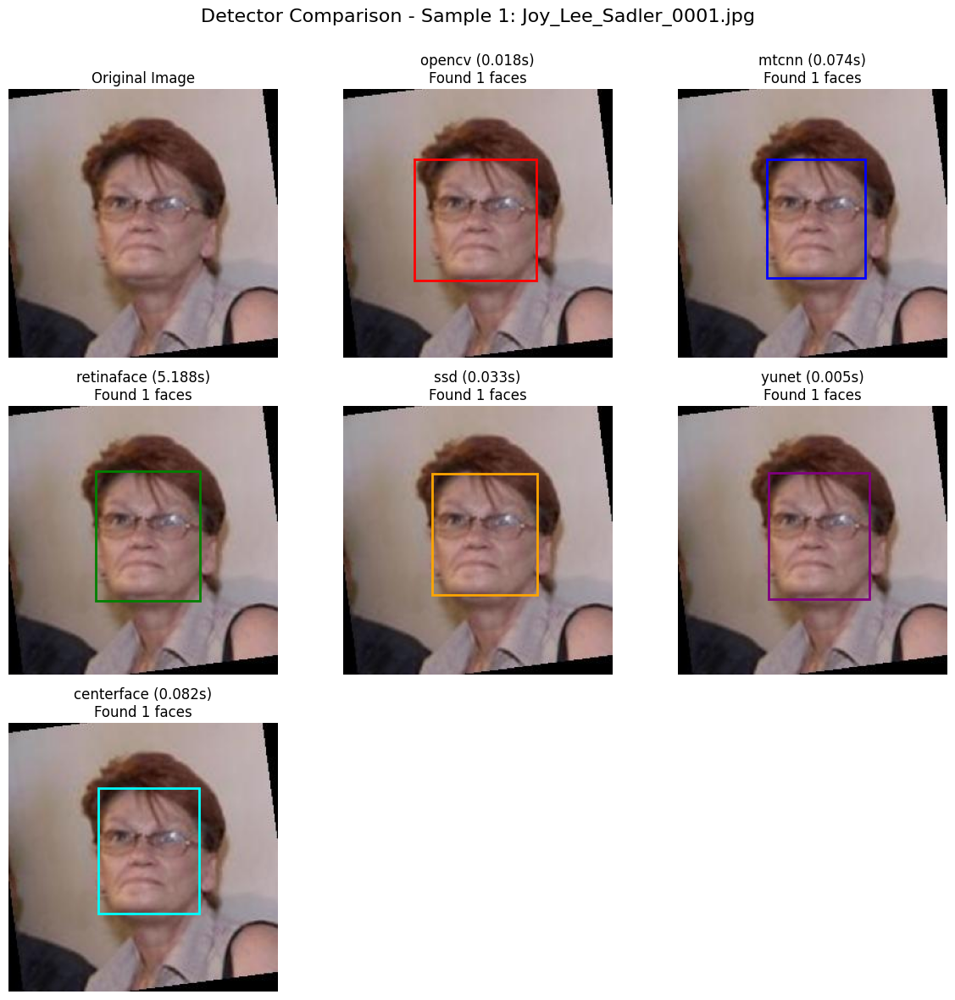

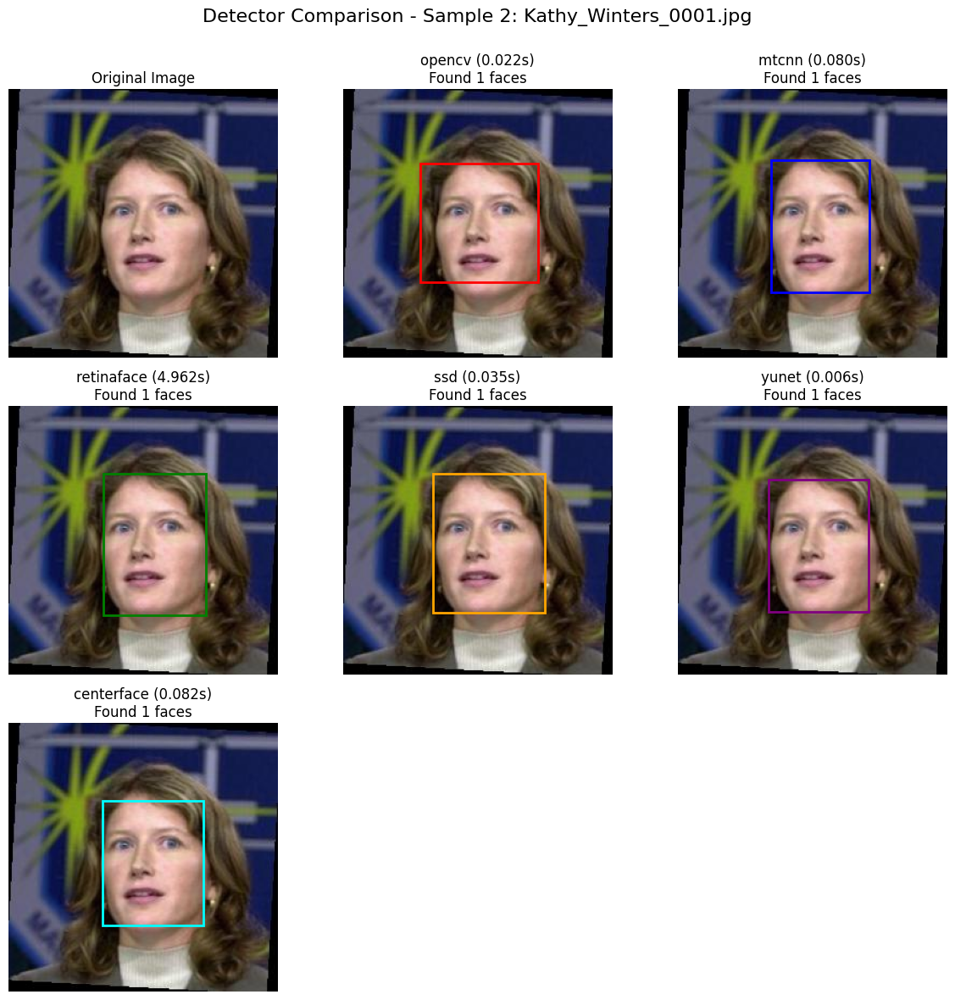

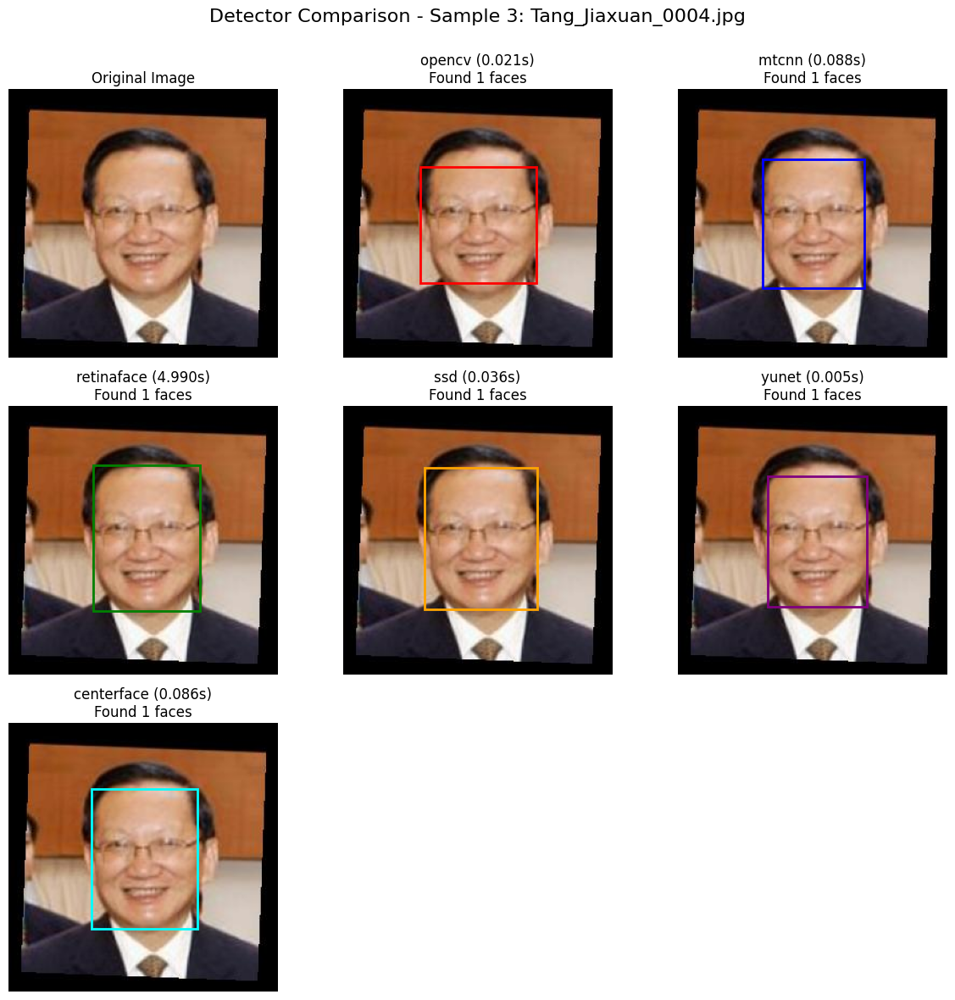

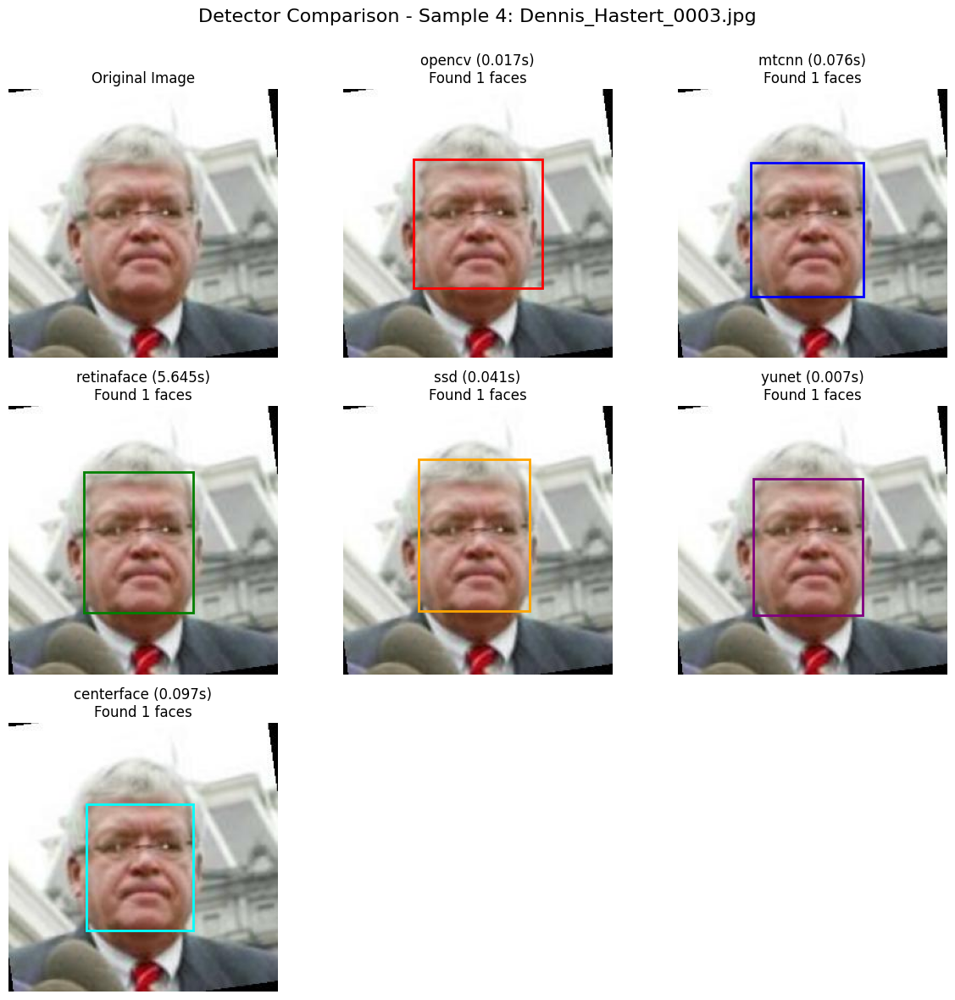

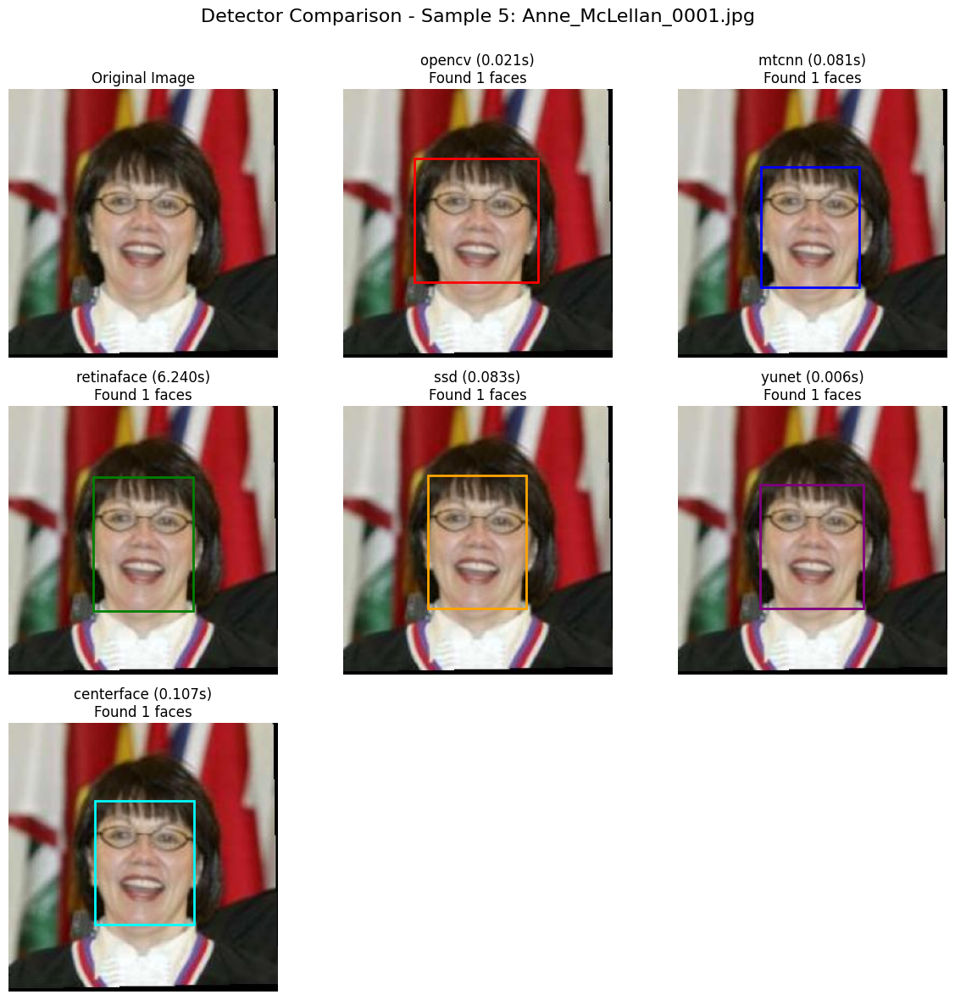

✅ Visualization complete!


({'lfw-deepfunneled\\Carin_Koch\\Carin_Koch_0001.jpg': [],
  'lfw-deepfunneled\\Sally_Clark\\Sally_Clark_0001.jpg': [],
  'lfw-deepfunneled\\Robert_Ehrlich\\Robert_Ehrlich_0002.jpg': [],
  'lfw-deepfunneled\\Colin_Powell\\Colin_Powell_0005.jpg': [],
  'lfw-deepfunneled\\Carol_Carmody\\Carol_Carmody_0001.jpg': [],
  'lfw-deepfunneled\\Scott_Rudin\\Scott_Rudin_0002.jpg': [],
  'lfw-deepfunneled\\Gray_Davis\\Gray_Davis_0006.jpg': [],
  'lfw-deepfunneled\\Toby_Keith\\Toby_Keith_0001.jpg': [],
  'lfw-deepfunneled\\Eliza_Dushku\\Eliza_Dushku_0001.jpg': [],
  'lfw-deepfunneled\\Valentina_Cervi\\Valentina_Cervi_0001.jpg': [],
  'lfw-deepfunneled\\Kelvin_Sampson\\Kelvin_Sampson_0002.jpg': [],
  'lfw-deepfunneled\\Felipe_Perez_Roque\\Felipe_Perez_Roque_0002.jpg': [],
  'lfw-deepfunneled\\Michael_Milton\\Michael_Milton_0001.jpg': [],
  'lfw-deepfunneled\\Bob_Hope\\Bob_Hope_0001.jpg': [],
  'lfw-deepfunneled\\Stephen_Cooper\\Stephen_Cooper_0001.jpg': [],
  'lfw-deepfunneled\\Mahathir_Mohamad\\Maha

In [10]:

def visualize_detector_bounding_boxes(test_annotations, images_dir, detectors=None, num_samples=3):
    """
    Visualize bounding boxes from different face detectors on sample images
    
    Args:
        test_annotations: Dictionary of test annotations (only used for image paths)
        images_dir: Path to images directory
        detectors: List of detector names (default: all available in DeepFace)
        num_samples: Number of sample images to visualize
    """
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    from deepface import DeepFace
    import random
    import time
    
    # If no specific detectors provided, use all available
    if detectors is None:
        detectors = ["opencv", "mtcnn", "retinaface", "ssd", "yunet", "centerface"]
    
    # Define colors for each detector
    colors = {
        "opencv": "red",
        "mtcnn": "blue",
        "retinaface": "green",
        "ssd": "orange",
        "yunet": "purple",
        "centerface": "cyan",
    }
    
    # Randomly select sample images
    sample_keys = list(test_annotations.keys())
    if len(sample_keys) > num_samples:
        sample_keys = random.sample(sample_keys, num_samples)
    
    print(f"🔍 Visualizing detector results on {num_samples} sample images...")
    
    for idx, img_key in enumerate(sample_keys):
        full_img_path = os.path.join(images_dir, img_key)
        
        if not os.path.exists(full_img_path):
            print(f"Image not found: {full_img_path}")
            continue
        
        img = cv2.imread(full_img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        total_plots = len(detectors) + 1
        
        if total_plots <= 3:
            rows, cols = 1, total_plots
        elif total_plots <= 6:
            rows, cols = 2, 3
        else:
            rows, cols = 3, 3
        
        fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
        fig.suptitle(f"Detector Comparison - Sample {idx+1}: {os.path.basename(img_key)}", fontsize=16)
        
        if rows == 1 and cols == 1:
            axes = np.array([axes])
        elif rows == 1 or cols == 1:
            axes = axes.flatten()
        else:
            axes = axes.flatten()
        
        axes[0].imshow(img_rgb)
        axes[0].set_title("Original Image")
        axes[0].axis("off")
        
        for i, detector in enumerate(detectors):
            if i+1 >= len(axes):  # Make sure we don't exceed array bounds
                break
                
            detector_img = img_rgb.copy()
            
            try:
                # Time the detection
                start_time = time.time()
                
                # Get face detections
                detections = DeepFace.extract_faces(
                    img_path=full_img_path,
                    detector_backend=detector,
                    enforce_detection=False,
                    align=False
                )
                
                detection_time = time.time() - start_time
                
                # Display the image
                axes[i+1].imshow(detector_img)
                axes[i+1].set_title(f"{detector} ({detection_time:.3f}s)")
                
                # Draw bounding boxes for all detected faces
                if len(detections) > 0:
                    for detection in detections:
                        face_box = detection.get("facial_area", {})
                        if face_box:
                            x = face_box.get("x", 0)
                            y = face_box.get("y", 0)
                            w = face_box.get("w", 0)
                            h = face_box.get("h", 0)
                            
                            # Draw rectangle on the image
                            rect = patches.Rectangle(
                                (x, y), w, h, 
                                linewidth=2, 
                                edgecolor=colors[detector], 
                                facecolor="none"
                            )
                            axes[i+1].add_patch(rect)
                
                axes[i+1].set_title(f"{detector} ({detection_time:.3f}s)\nFound {len(detections)} faces")
                        
            except Exception as e:
                axes[i+1].text(0.5, 0.5, f"Error: {str(e)[:50]}...", 
                        ha='center', va='center', transform=axes[i+1].transAxes)
            
            axes[i+1].axis("off")
        
        # Hide unused subplots
        for i in range(len(detectors) + 1, len(axes)):
            axes[i].axis('off')
            axes[i].set_visible(False)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)  
        plt.show()
        
    print("✅ Visualization complete!")

def compare_detector_outputs(num_samples=3):

    print("Setting up LFW dataset...")
    lfw_setup = LFWDatasetSetup()
    test_annotations, images_dir = lfw_setup.setup_complete_dataset()
    
    if test_annotations is None:
        print("❌ Failed to setup LFW dataset")
        return
        
    detectors = ["opencv", "mtcnn", "retinaface", "ssd", "yunet", "centerface"]
    
    visualize_detector_bounding_boxes(
        test_annotations=test_annotations,
        images_dir=images_dir,
        detectors=detectors,
        num_samples=num_samples
    )
    
    return test_annotations, images_dir

compare_detector_outputs(num_samples=5)

Setting up LFW dataset...
🚀 Setting up LFW dataset for face detection testing...
🔍 Scanning images...
✅ Found 13233 images

📈 LFW Dataset Statistics:
  Total images: 13233
  Average image size: 250 x 250


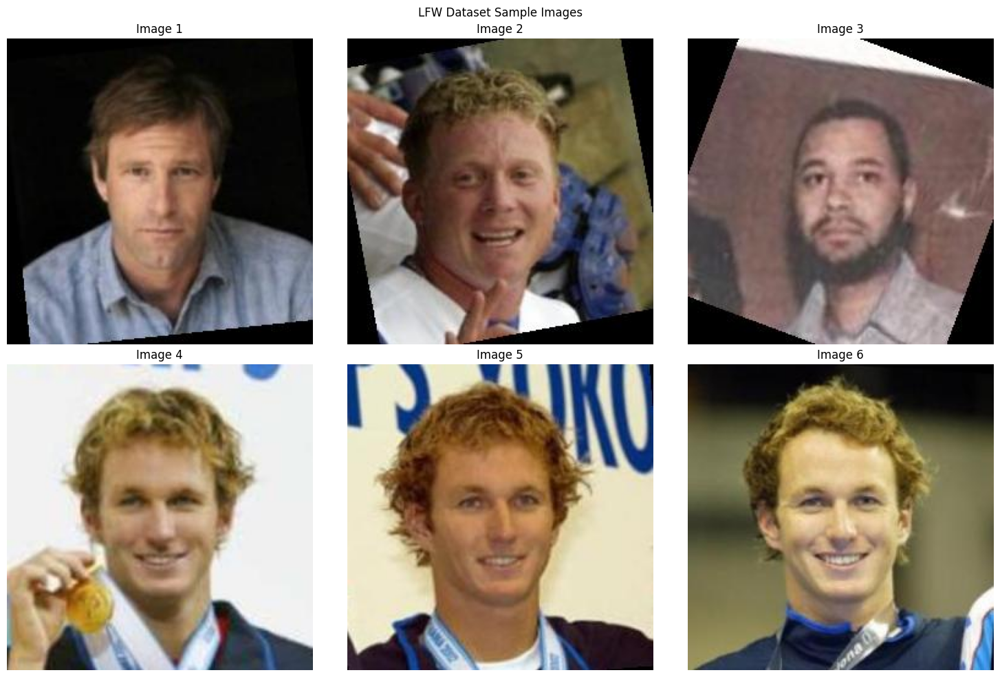

📊 Dataset split:
  Training images: 10586
  Testing images: 2647
✅ LFW dataset setup complete!
📍 Images location: data/lfw/lfw-deepfunneled

STARTING DEEPFACE DETECTOR PERFORMANCE TEST
STARTING DEEPFACE DETECTOR PERFORMANCE TEST
🚀 Starting comprehensive detector testing...
📊 Testing on 30 images

🔍 Testing opencv detector...
  Progress: 0/30 images processed
  Progress: 20/30 images processed
  ✅ opencv completed:
    - Avg Detection Time: 0.020s
    - Throughput: 51.15 images/sec
    - Success Rate: 1.000
    - Error Rate: 0.000

🔍 Testing mtcnn detector...
  Progress: 0/30 images processed
  Progress: 20/30 images processed
  ✅ mtcnn completed:
    - Avg Detection Time: 0.080s
    - Throughput: 12.43 images/sec
    - Success Rate: 1.000
    - Error Rate: 0.000

🔍 Testing retinaface detector...
  Progress: 0/30 images processed
  Progress: 20/30 images processed
  ✅ retinaface completed:
    - Avg Detection Time: 5.200s
    - Throughput: 0.19 images/sec
    - Success Rate: 1.000
    -


🏆 Best Detector Analysis:
  ⚡ Fastest: yunet (0.005s)
  🚀 Highest Throughput: yunet (182.93 img/sec)
  🎯 Most Reliable: opencv (1.000)
  ✅ Least Errors: opencv (0.000)
  🎖️ Multiple detectors have perfect reliability. Among them, fastest is: yunet (0.005s)


In [11]:
def run_deepface_test():
    print("Setting up LFW dataset...")
    lfw_setup = LFWDatasetSetup()
    test_annotations, images_dir = lfw_setup.setup_complete_dataset(visualize=True)
    
    if test_annotations is None:
        print("❌ Failed to setup LFW dataset")
        return
    
    print("\n" + "="*60)
    print("STARTING DEEPFACE DETECTOR PERFORMANCE TEST")
    print("="*60)
    
    detector_test = DeepFaceDetectorTest(test_annotations, images_dir)
    
    results = detector_test.test_all_detectors(max_images=30)
    
    detector_test.create_performance_plots()
    
    detector_test.get_best_detector()
    
    return detector_test

test_instance = run_deepface_test()

I wonder why there were some differences in the number of faces detected by these detectors so I ran through them again with 100 images and I discovered that like they said, retinaface is the most accurate ones as they can detect multiple faces within an image. However, for our use case, we only need to detect one major face within the frame. 

Setting up LFW dataset...
🚀 Setting up LFW dataset for face detection testing...
🔍 Scanning images...
✅ Found 13233 images

📈 LFW Dataset Statistics:
  Total images: 13233
  Average image size: 250 x 250
📊 Dataset split:
  Training images: 10586
  Testing images: 2647
✅ LFW dataset setup complete!
📍 Images location: data/lfw/lfw-deepfunneled
STARTING DEEPFACE DETECTOR PERFORMANCE TEST
🚀 Starting comprehensive detector testing...
📊 Testing on 100 images

🔍 Testing opencv detector...
  Progress: 0/100 images processed
  Progress: 20/100 images processed
  Progress: 40/100 images processed
  Progress: 60/100 images processed
  Progress: 80/100 images processed
  ✅ opencv completed:
    - Avg Detection Time: 0.029s
    - Throughput: 34.77 images/sec
    - Success Rate: 1.000
    - Error Rate: 0.000

🔍 Testing mtcnn detector...
  Progress: 0/100 images processed
  Progress: 20/100 images processed
  Progress: 40/100 images processed
  Progress: 60/100 images processed
  Progress: 80/100 ima

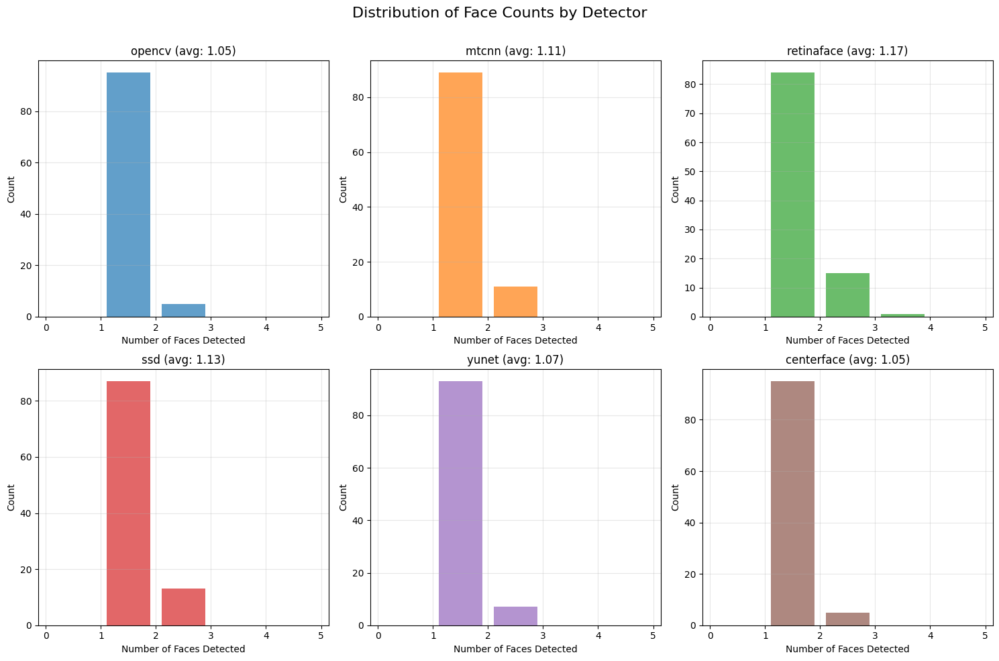

🔍 Looking for images where detectors find multiple faces...


Scanning for multiple face detections: 100%|██████████| 200/200 [01:55<00:00,  1.74it/s]



📊 Found 3 examples where opencv detected multiple faces


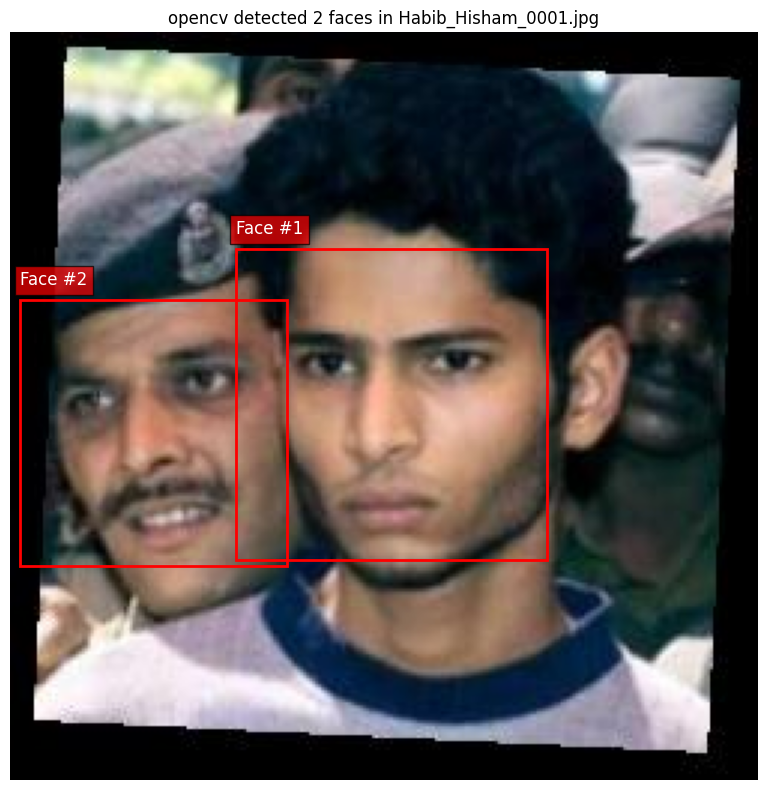

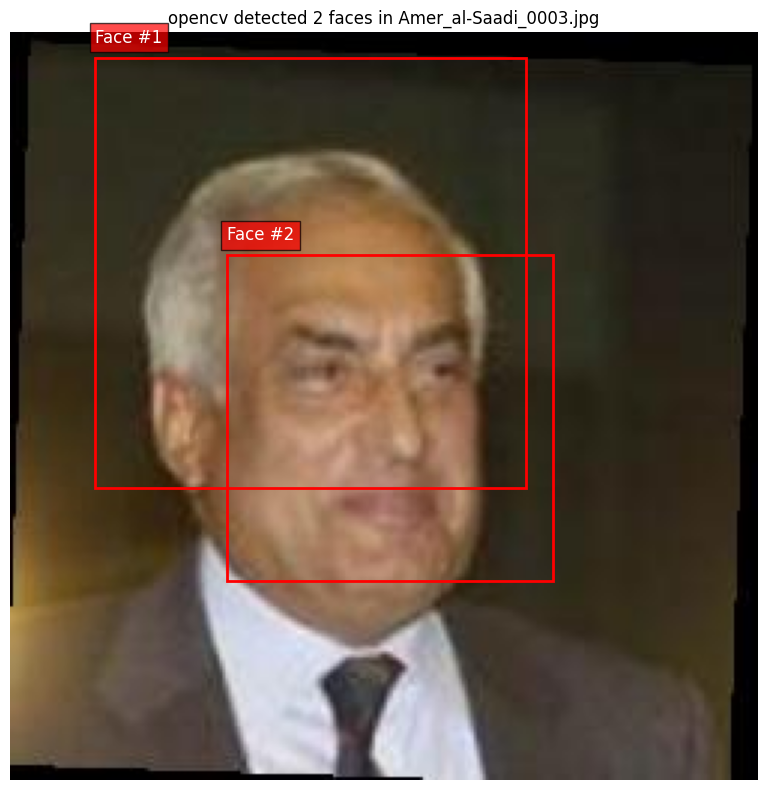

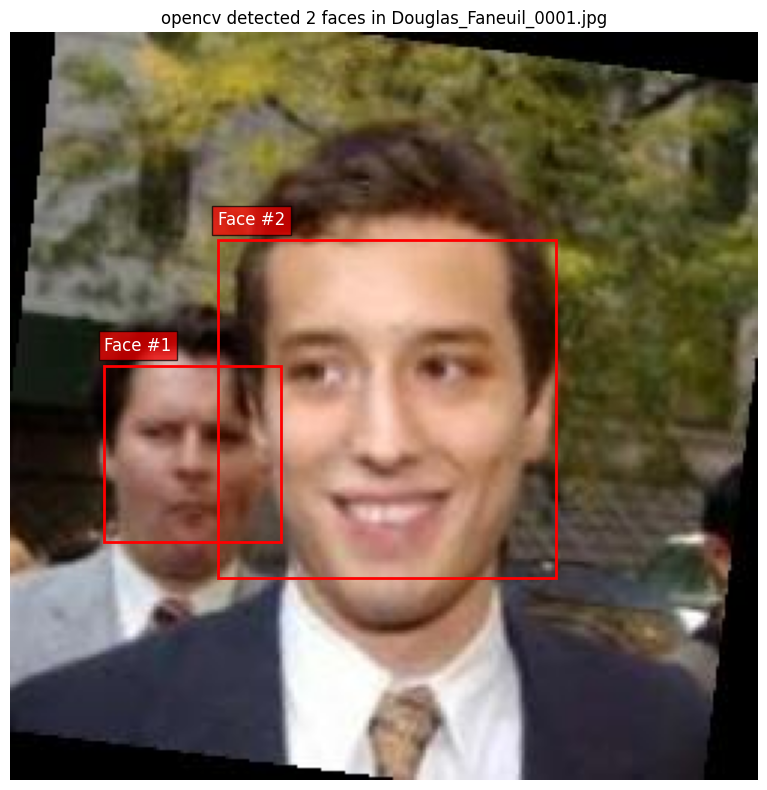


📊 Found 3 examples where mtcnn detected multiple faces


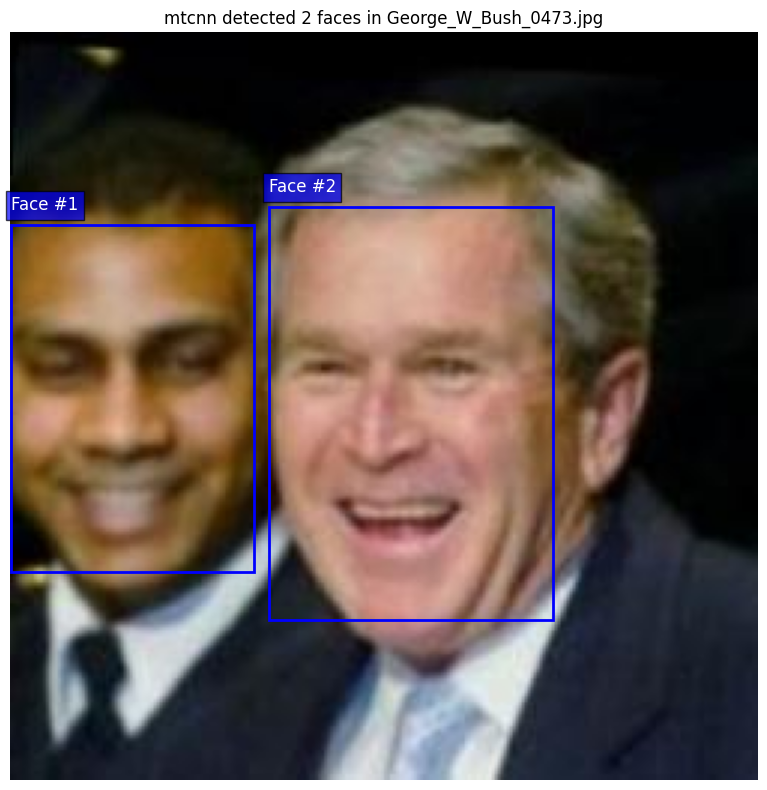

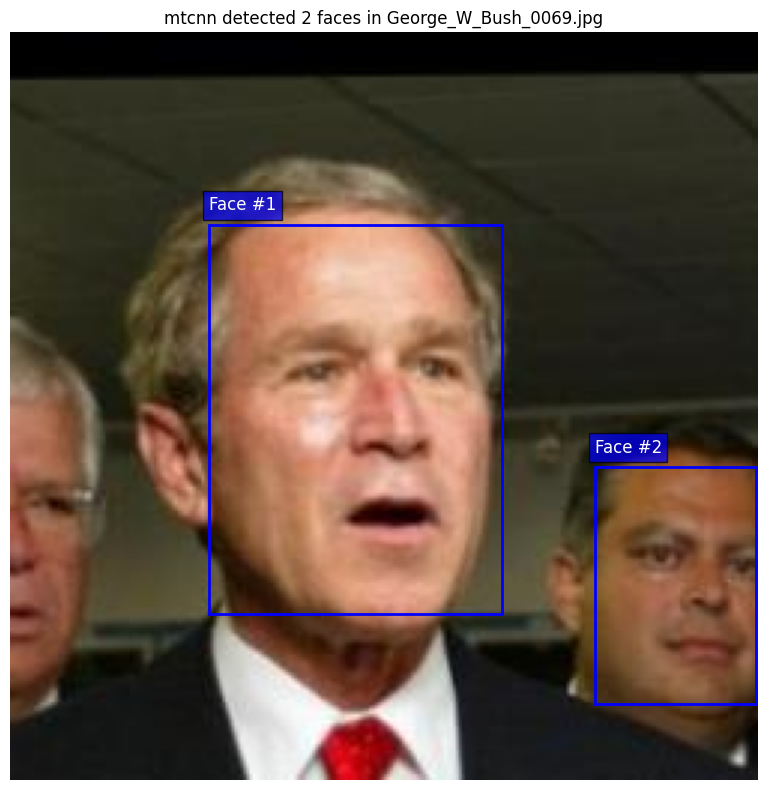

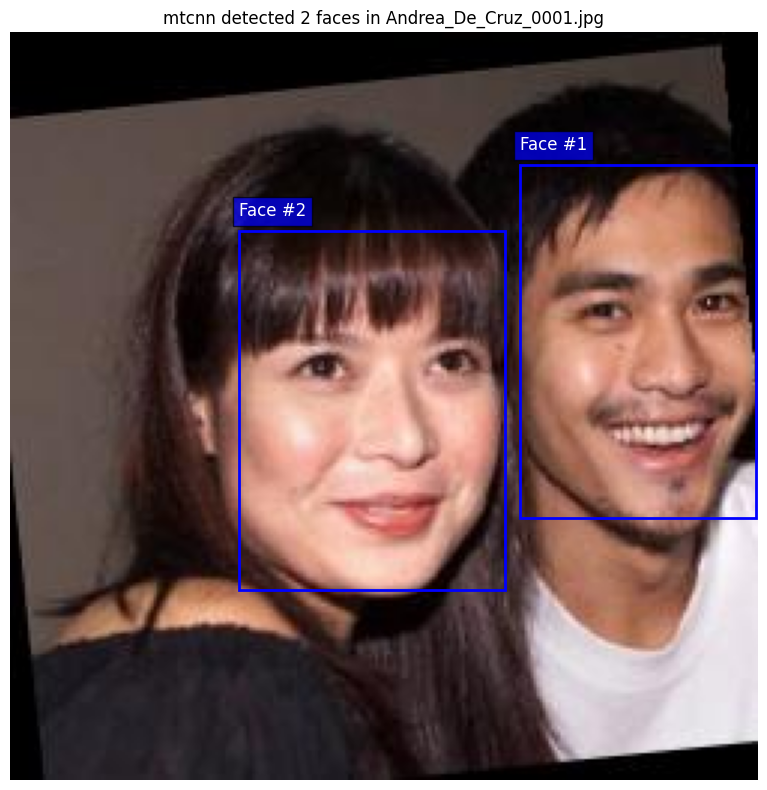


📊 Found 3 examples where retinaface detected multiple faces


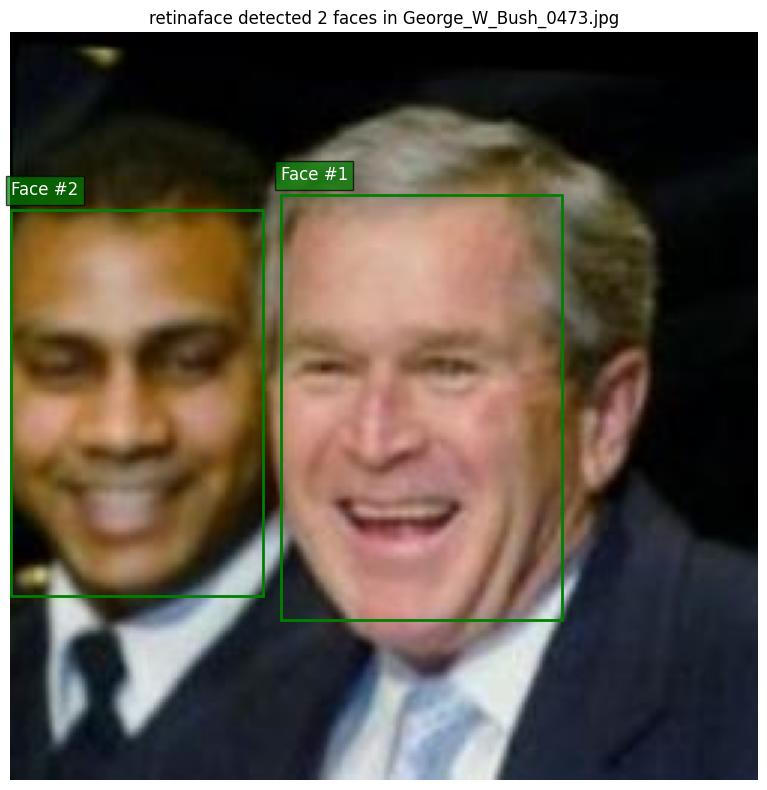

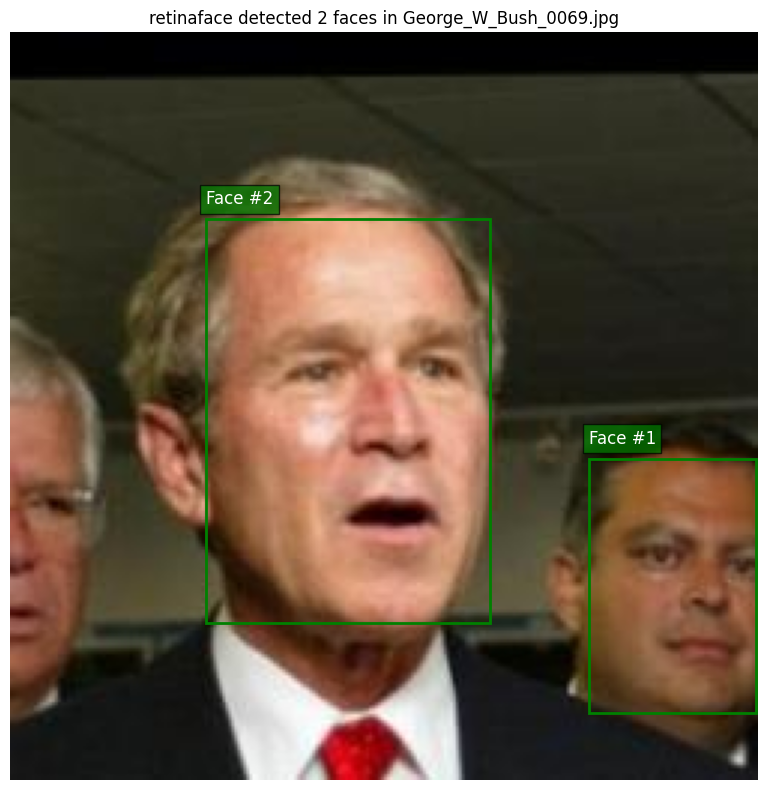

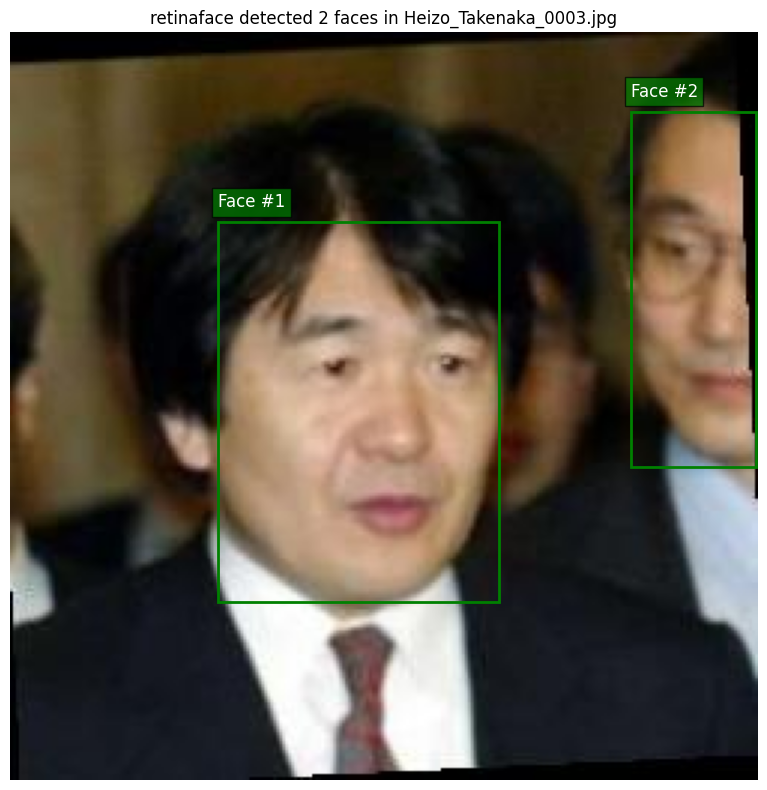


📊 Found 3 examples where ssd detected multiple faces


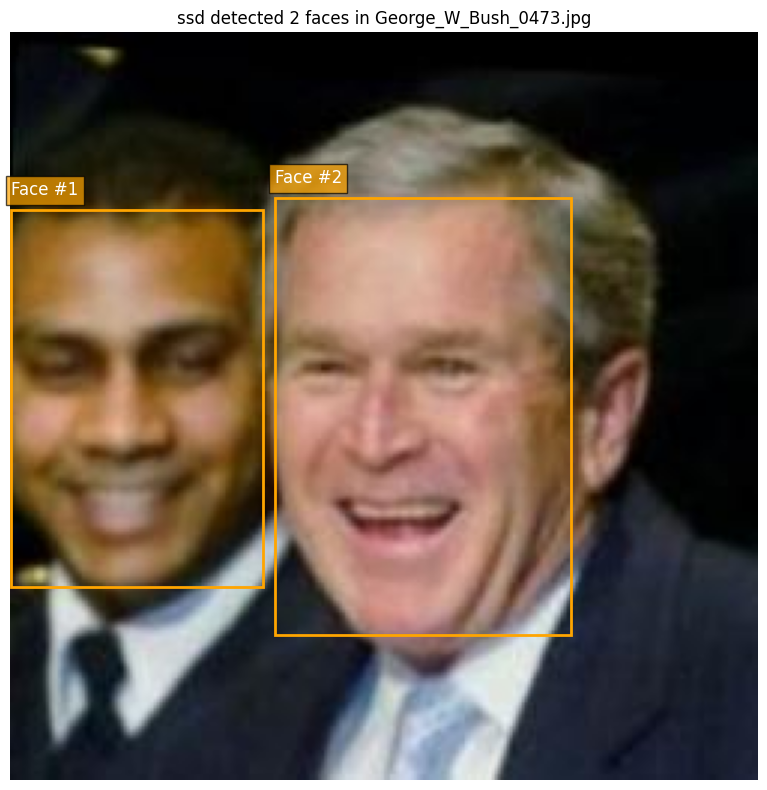

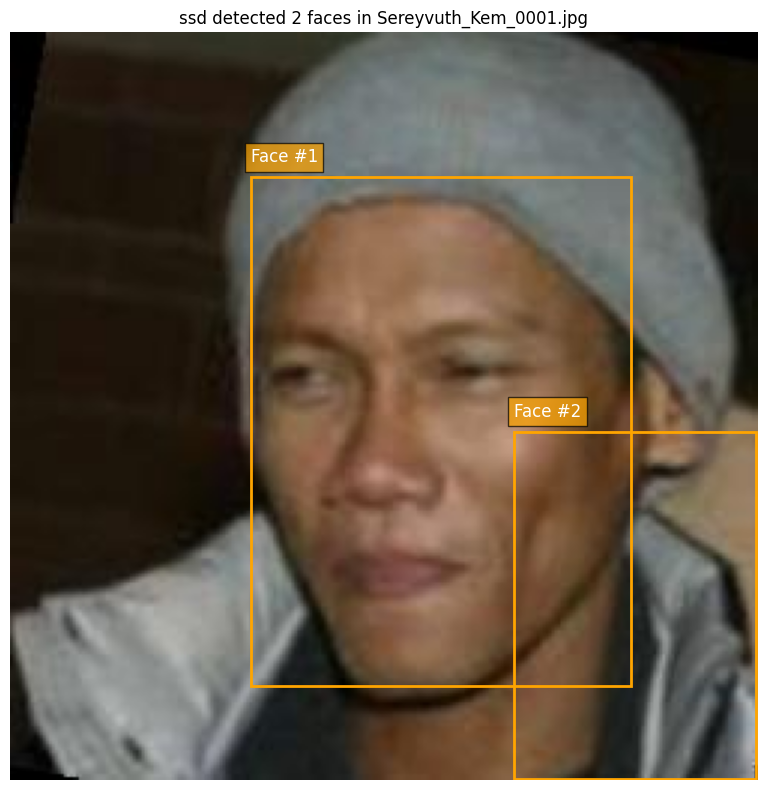

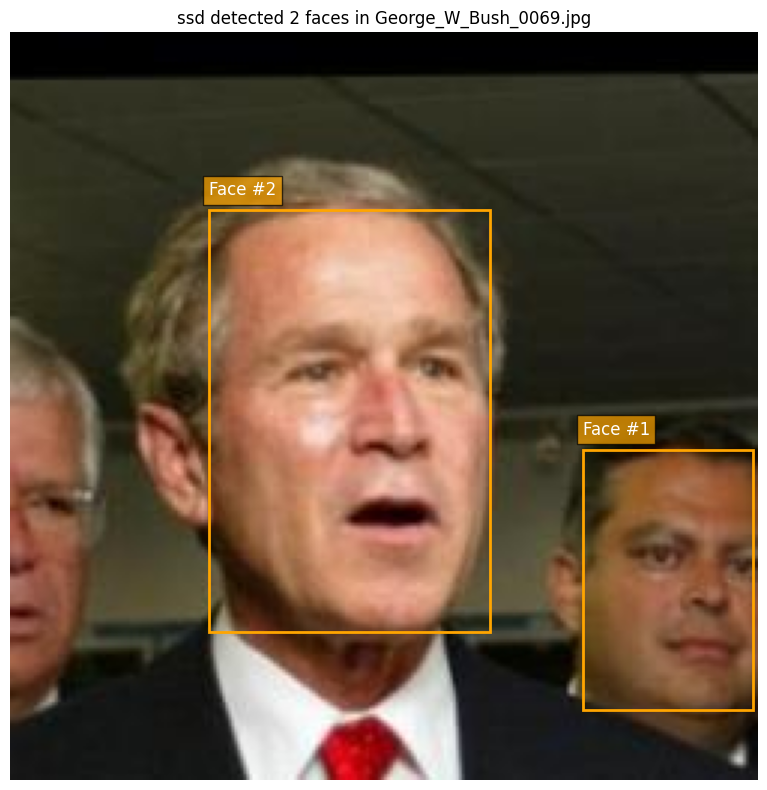


📊 Found 3 examples where yunet detected multiple faces


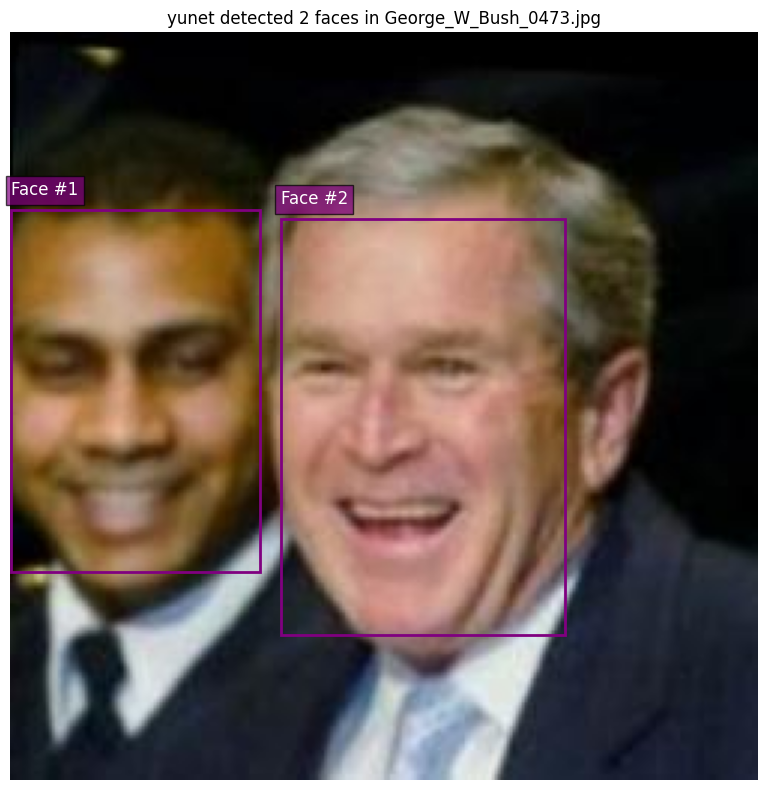

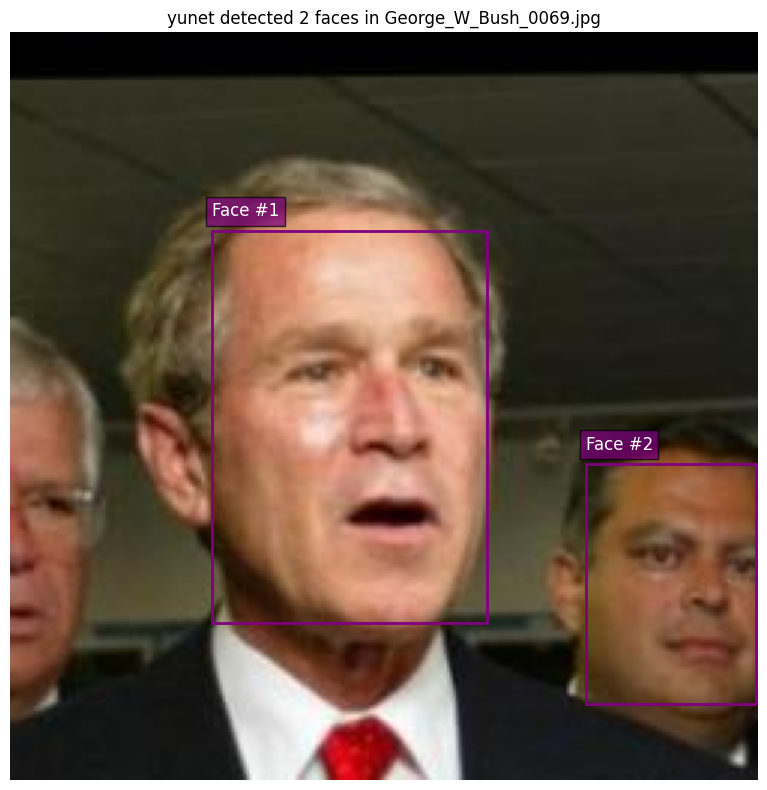

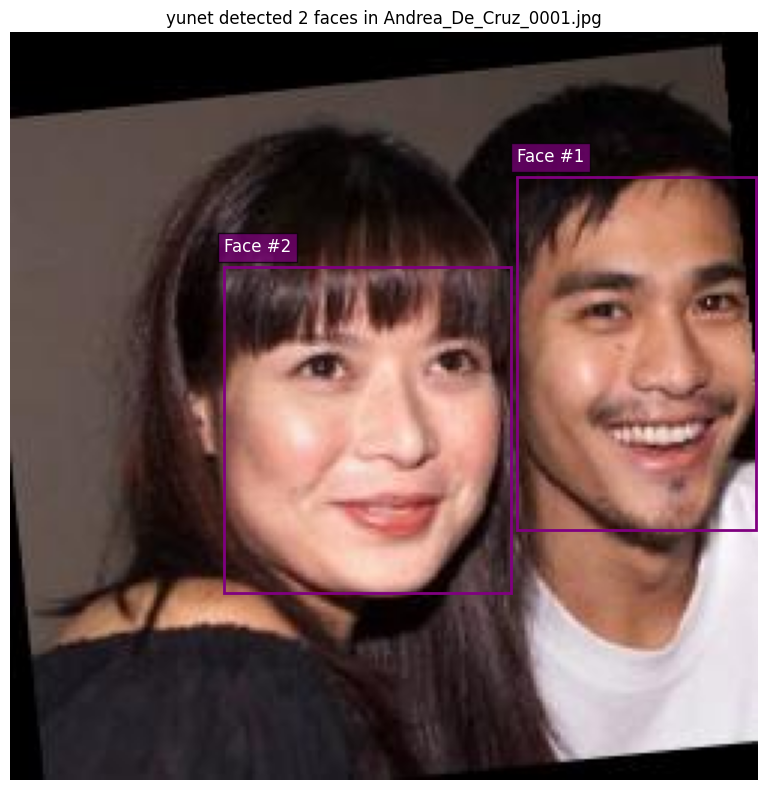


📊 Found 3 examples where centerface detected multiple faces


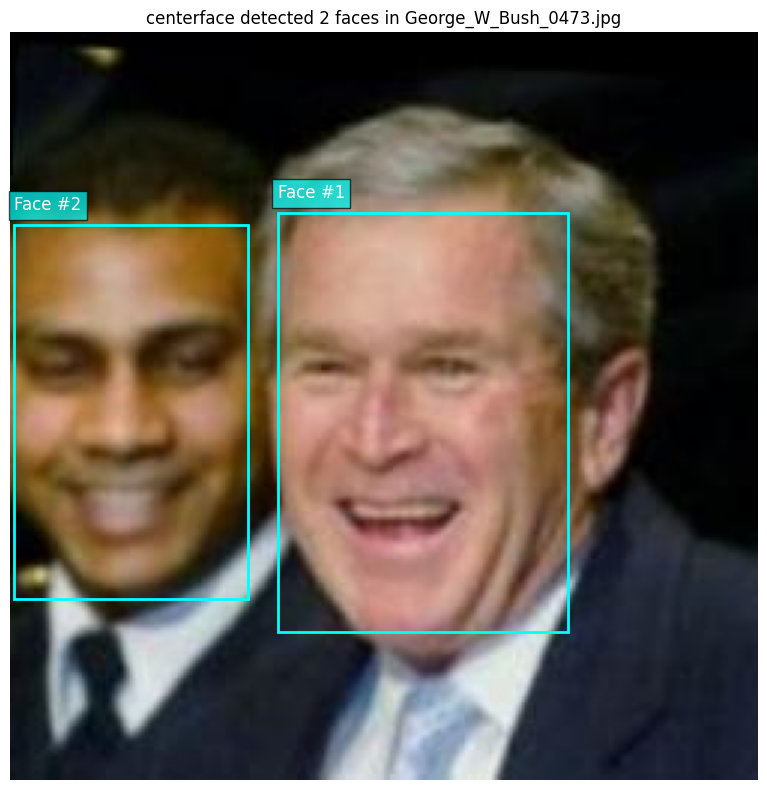

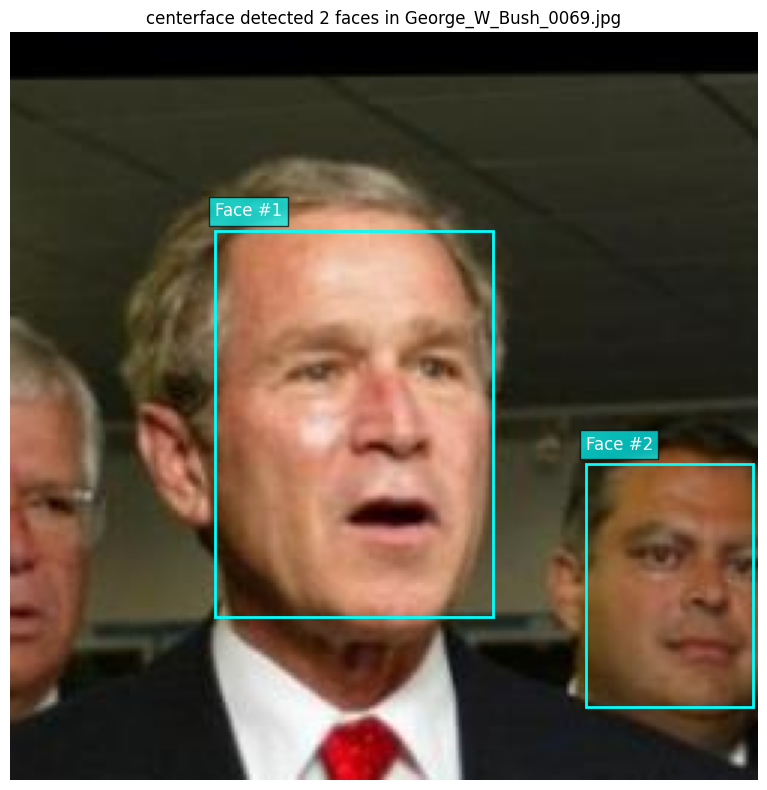

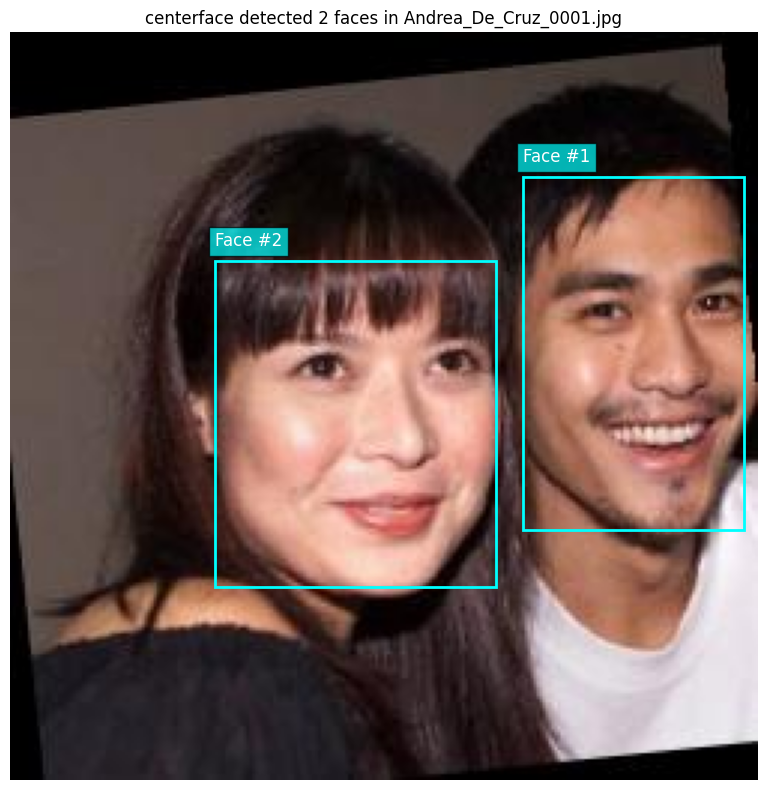

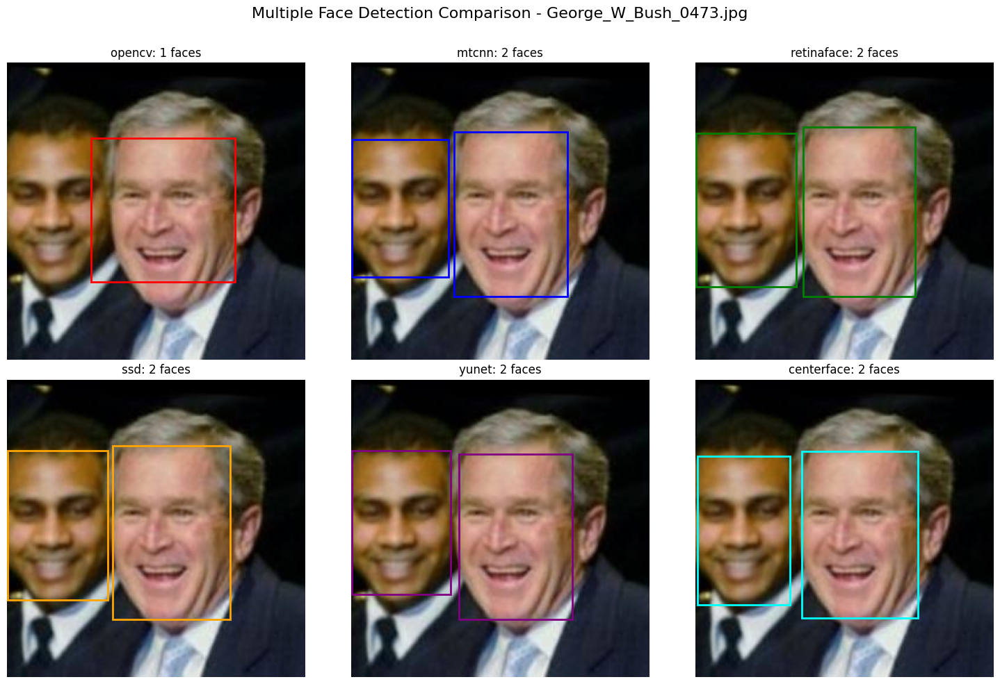

In [ ]:
def visualize_multiple_face_detections(test_annotations, images_dir, detectors=None, num_samples=5):
 
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    from deepface import DeepFace
    import random
    import time
    
    if detectors is None:
        detectors = ["retinaface", "mtcnn", "opencv", "ssd", "yunet", "centerface"]
    
    colors = {
        "opencv": "red",
        "mtcnn": "blue",
        "retinaface": "green",
        "ssd": "orange",
        "yunet": "purple",
        "centerface": "cyan",
    }
    
    print(f"🔍 Looking for images where detectors find multiple faces...")
    
    multi_face_examples = {detector: [] for detector in detectors}
    
    sample_keys = list(test_annotations.keys())[:200]  # Test first 200 images
    
    for img_key in tqdm(sample_keys, desc="Scanning for multiple face detections"):
        full_img_path = os.path.join(images_dir, img_key)
        
        if not os.path.exists(full_img_path):
            continue
            
        for detector in detectors:
            if len(multi_face_examples[detector]) >= num_samples:
                continue
                
            try:
                detections = DeepFace.extract_faces(
                    img_path=full_img_path,
                    detector_backend=detector,
                    enforce_detection=False,
                    align=False
                )
                
                # If multiple faces detected, add to examples
                if len(detections) > 1:
                    multi_face_examples[detector].append({
                        "img_path": full_img_path,
                        "detections": detections,
                        "count": len(detections)
                    })
            except:
                continue
    
    # Check if we found examples
    any_examples = any(len(examples) > 0 for examples in multi_face_examples.values())
    
    if not any_examples:
        print("No examples of multiple face detections found in the sample.")
        return
    
    # Visualize the examples
    for detector, examples in multi_face_examples.items():
        if not examples:
            print(f"No multiple face detections found for {detector}")
            continue
            
        print(f"\n📊 Found {len(examples)} examples where {detector} detected multiple faces")
        
        # Show up to num_samples examples
        for i, example in enumerate(examples[:num_samples]):
            img_path = example["img_path"]
            detections = example["detections"]
            count = example["count"]
            
            # Load image
            img = cv2.imread(img_path)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Create figure
            plt.figure(figsize=(10, 8))
            plt.imshow(img_rgb)
            plt.title(f"{detector} detected {count} faces in {os.path.basename(img_path)}")
            
            # Draw bounding boxes
            for j, detection in enumerate(detections):
                face_box = detection.get("facial_area", {})
                if face_box:
                    x = face_box.get("x", 0)
                    y = face_box.get("y", 0)
                    w = face_box.get("w", 0)
                    h = face_box.get("h", 0)
                    
                    # Draw rectangle
                    rect = patches.Rectangle(
                        (x, y), w, h, 
                        linewidth=2, 
                        edgecolor=colors[detector], 
                        facecolor="none"
                    )
                    plt.gca().add_patch(rect)
                    
                    # Add face number label
                    plt.text(x, y-5, f"Face #{j+1}", 
                             color='white', fontsize=12, 
                             bbox=dict(facecolor=colors[detector], alpha=0.7))
            
            plt.axis("off")
            plt.tight_layout()
            plt.show()
    
    # Create a comparison of all detectors on one example image
    # Find an image where at least one detector found multiple faces
    example_images = []
    for detector, examples in multi_face_examples.items():
        if examples:
            for example in examples:
                example_images.append(example["img_path"])
    
    if example_images:
        # Pick a random example
        example_img_path = random.choice(example_images)
        
        # Create detector comparison
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()
        fig.suptitle(f"Multiple Face Detection Comparison - {os.path.basename(example_img_path)}", fontsize=16)
        
        # Load image once
        img = cv2.imread(example_img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        for i, detector in enumerate(detectors):
            if i >= len(axes):
                break
                
            # Display image
            axes[i].imshow(img_rgb)
            axes[i].set_title(detector)
            axes[i].axis("off")
            
            try:
                # Get detections
                detections = DeepFace.extract_faces(
                    img_path=example_img_path,
                    detector_backend=detector,
                    enforce_detection=False,
                    align=False
                )
                
                # Draw bounding boxes
                for j, detection in enumerate(detections):
                    face_box = detection.get("facial_area", {})
                    if face_box:
                        x = face_box.get("x", 0)
                        y = face_box.get("y", 0)
                        w = face_box.get("w", 0)
                        h = face_box.get("h", 0)
                        
                        # Draw rectangle
                        rect = patches.Rectangle(
                            (x, y), w, h, 
                            linewidth=2, 
                            edgecolor=colors[detector], 
                            facecolor="none"
                        )
                        axes[i].add_patch(rect)
                
                # Add count to title
                axes[i].set_title(f"{detector}: {len(detections)} faces")
                
            except Exception as e:
                axes[i].text(0.5, 0.5, f"Error: {str(e)[:50]}...", 
                          ha='center', va='center', transform=axes[i].transAxes)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()

def analyze_face_counts():
    """Analyze and visualize the number of faces detected by different detectors"""
    print("Setting up LFW dataset...")
    lfw_setup = LFWDatasetSetup()
    test_annotations, images_dir = lfw_setup.setup_complete_dataset()
    
    if test_annotations is None:
        print("❌ Failed to setup LFW dataset")
        return
    
    detector_test = DeepFaceDetectorTest(test_annotations, images_dir)
    results = detector_test.test_all_detectors(max_images=100)
    
    detectors = list(results.keys())
    plt.figure(figsize=(15, 10))
    
    for i, detector in enumerate(detectors):
        face_counts = results[detector]['faces_detected']
        
        # Skip empty results
        if not face_counts:
            continue
            
        plt.subplot(2, 3, i+1)
        plt.hist(face_counts, bins=range(0, 6), alpha=0.7, 
                 rwidth=0.8, color=plt.cm.tab10(i))
        plt.title(f"{detector} (avg: {np.mean(face_counts):.2f})")
        plt.xlabel("Number of Faces Detected")
        plt.ylabel("Count")
        plt.xticks(range(0, 6))
        plt.grid(alpha=0.3)
    
    plt.suptitle("Distribution of Face Counts by Detector", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()
    
    # Show examples of multiple face detections
    visualize_multiple_face_detections(
        test_annotations=test_annotations,
        images_dir=images_dir,
        detectors=detectors,
        num_samples=3
    )
    
    return results

# Run the analysis
face_count_results = analyze_face_counts()

opencv and ssd are also very fast but they seem to have some inaccuracies!

Which means we are going to use yunet for the detector because of its great effiency and its decent accuracy.


## Testing performance with detectors

In [10]:
import os
import cv2
import time
import numpy as np
import pandas as pd
from deepface import DeepFace
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

class DeepFaceSpeedBenchmark:
    def __init__(self, images_dir):
        self.images_dir = images_dir
        
        # All available models in DeepFace
        self.models = [
            "VGG-Face", 
            "Facenet", 
            "Facenet512", 
            "OpenFace", 
            "ArcFace", 
            "SFace"
        ]
        
        self.distance_metrics = ["cosine", "euclidean", "euclidean_l2"]
        
        self.speed_results = {}
        self.test_images = []
        
    def prepare_test_images(self, max_images=100):
        """Prepare a set of test images from LFW dataset"""
        print("🔍 Preparing test images...")
        
        image_paths = []
        for root, dirs, files in os.walk(self.images_dir):
            for file in files:
                if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    full_path = os.path.join(root, file)
                    if os.path.exists(full_path):
                        # Quick check if image loads properly
                        img = cv2.imread(full_path)
                        if img is not None:
                            image_paths.append(full_path)
                            if len(image_paths) >= max_images:
                                break
            if len(image_paths) >= max_images:
                break
        
        self.test_images = image_paths[:max_images]
        print(f"✅ Prepared {len(self.test_images)} test images")
        return self.test_images
    

    
    def benchmark_embedding_generation_speed(self, num_images=50):
        """Benchmark embedding generation speed for different models"""
        print("\n🧠 Benchmarking Embedding Generation Speed...")
        
        test_images = self.test_images[:num_images]
        embedding_results = {}
        
        for model in self.models:
            print(f"  Testing {model}...")
            
            times = []
            successful_embeddings = 0
            failed_embeddings = 0
            embedding_sizes = []
            
            for img_path in test_images:
                try:
                    start_time = time.time()
                    
                    # Generate embedding
                    embedding = DeepFace.represent(
                        img_path=img_path,
                        model_name=model,
                        enforce_detection=False
                    )
                    
                    embedding_time = time.time() - start_time
                    times.append(embedding_time)
                    successful_embeddings += 1
                    
                    # Get embedding size
                    if isinstance(embedding, list) and len(embedding) > 0:
                        embedding_sizes.append(len(embedding[0]['embedding']))
                    
                except Exception as e:
                    failed_embeddings += 1
                    times.append(0)
            
            embedding_results[model] = {
                'avg_time': np.mean([t for t in times if t > 0]),
                'total_time': sum(times),
                'successful_embeddings': successful_embeddings,
                'failed_embeddings': failed_embeddings,
                'success_rate': successful_embeddings / len(test_images) if test_images else 0,
                'avg_embedding_size': np.mean(embedding_sizes) if embedding_sizes else 0,
                'times': times
            }
            
            print(f"    {model}: {embedding_results[model]['avg_time']:.3f}s avg, "
                  f"{embedding_results[model]['success_rate']:.2%} success rate, "
                  f"embedding size: {embedding_results[model]['avg_embedding_size']:.0f}")
        
        self.embedding_results = embedding_results
        return embedding_results
    
    def benchmark_face_verification_speed(self, num_pairs=30):
        """Benchmark face verification speed"""
        print("\n🔄 Benchmarking Face Verification Speed...")
        
        # Create random pairs from test images
        if len(self.test_images) < 2:
            print("❌ Not enough test images for verification")
            return
        
        verification_pairs = []
        for _ in range(num_pairs):
            img1, img2 = np.random.choice(self.test_images, 2, replace=False)
            verification_pairs.append((img1, img2))
        
        verification_results = {}
        
        for model in self.models:
            print(f"  Testing {model} verification...")
            
            times = []
            successful_verifications = 0
            failed_verifications = 0
            
            for img1_path, img2_path in verification_pairs:
                try:
                    start_time = time.time()
                    
                    # Verify faces
                    result = DeepFace.verify(
                        img1_path=img1_path,
                        img2_path=img2_path,
                        model_name=model,
                        distance_metric="cosine",
                        enforce_detection=False
                    )
                    
                    verification_time = time.time() - start_time
                    times.append(verification_time)
                    successful_verifications += 1
                    
                except Exception as e:
                    failed_verifications += 1
                    times.append(0)
            
            verification_results[model] = {
                'avg_time': np.mean([t for t in times if t > 0]),
                'total_time': sum(times),
                'successful_verifications': successful_verifications,
                'failed_verifications': failed_verifications,
                'success_rate': successful_verifications / len(verification_pairs) if verification_pairs else 0,
                'times': times
            }
            
            print(f"    {model}: {verification_results[model]['avg_time']:.3f}s avg, "
                  f"{verification_results[model]['success_rate']:.2%} success rate")
        
        self.verification_results = verification_results
        return verification_results
    
    def create_speed_comparison_plots(self):
        """Create comprehensive speed comparison visualizations"""
        if not hasattr(self, 'embedding_results') or not hasattr(self, 'verification_results'):
            print("❌ No results to plot. Run benchmarks first.")
            return

        # Create subplots with better spacing
        fig = make_subplots(
            rows=2, cols=2,
            subplot_titles=(
                'Embedding Generation Speed (by Model)',
                'Face Verification Speed (by Model)',
                'Speed vs Embedding Size',
                'Success Rates Comparison'
            ),
            specs=[[{"secondary_y": False}, {"secondary_y": False}],
                [{"secondary_y": False}, {"secondary_y": False}]],
            horizontal_spacing=0.12,
            vertical_spacing=0.15
        )

        models = list(self.embedding_results.keys())

        # 1. Embedding Generation Speed
        embedding_times = [self.embedding_results[m]['avg_time'] for m in models]

        fig.add_trace(
            go.Bar(name='Embedding Time', x=models, y=embedding_times,
                marker_color='lightgreen', showlegend=False),
            row=1, col=1
        )

        # 2. Face Verification Speed
        verification_times = [self.verification_results[m]['avg_time'] for m in models]

        fig.add_trace(
            go.Bar(name='Verification Time', x=models, y=verification_times,
                marker_color='lightcoral', showlegend=False),
            row=1, col=2
        )

        # 3. Speed vs Embedding Size
        embedding_sizes = [self.embedding_results[m]['avg_embedding_size'] for m in models]

        fig.add_trace(
            go.Scatter(
                x=embedding_times,
                y=embedding_sizes,
                mode='markers+text',
                text=models,
                textposition="top right",
                marker=dict(size=12, color=verification_times,
                            colorscale='Viridis', showscale=True,
                            colorbar=dict(title="Verification Time (s)")),
                name='Speed vs Size',
                showlegend=False
            ),
            row=2, col=1
        )

        # 4. Success Rates
        embedding_success = [self.embedding_results[m]['success_rate'] * 100 for m in models]
        verification_success = [self.verification_results[m]['success_rate'] * 100 for m in models]

        fig.add_trace(
            go.Bar(name='Embedding Success', x=models, y=embedding_success,
                marker_color='gold', showlegend=True),
            row=2, col=2
        )
        fig.add_trace(
            go.Bar(name='Verification Success', x=models, y=verification_success,
                marker_color='orange', showlegend=True),
            row=2, col=2
        )

        # Update layout
        fig.update_layout(
            title_text="DeepFace Recognition Models Speed Benchmark",
            title_font_size=20,
            height=1000,
            width=1600,
            margin=dict(t=80, b=60, l=60, r=60)
        )

        # Update axes
        fig.update_xaxes(title_text="Model", tickangle=60, row=1, col=1)
        fig.update_yaxes(title_text="Time (seconds)", row=1, col=1)
        fig.update_xaxes(title_text="Model", tickangle=60, row=1, col=2)
        fig.update_yaxes(title_text="Time (seconds)", row=1, col=2)
        fig.update_xaxes(title_text="Embedding Time (seconds)", row=2, col=1)
        fig.update_yaxes(title_text="Embedding Size", row=2, col=1)
        fig.update_xaxes(title_text="Model", tickangle=60, row=2, col=2)
        fig.update_yaxes(title_text="Success Rate (%)", row=2, col=2)

        fig.show()
        
    def create_detailed_speed_table(self):
        """Create detailed speed comparison table"""
        table_data = []
        
        for model in self.models:
            embedding_data = self.embedding_results.get(model, {})
            verification_data = self.verification_results.get(model, {})
            
            table_data.append({
                'Model': model,
                'Embedding Time (s)': f"{embedding_data.get('avg_time', 0):.3f}",
                'Verification Time (s)': f"{verification_data.get('avg_time', 0):.3f}",
                'Embedding Success Rate': f"{embedding_data.get('success_rate', 0):.2%}",
                'Verification Success Rate': f"{verification_data.get('success_rate', 0):.2%}",
                'Embedding Size': f"{embedding_data.get('avg_embedding_size', 0):.0f}",
                'Total Embedding Time (s)': f"{embedding_data.get('total_time', 0):.2f}",
                'Total Verification Time (s)': f"{verification_data.get('total_time', 0):.2f}"
            })
        
        df = pd.DataFrame(table_data)
        
        fig = go.Figure(data=[go.Table(
            header=dict(values=list(df.columns),
                       fill_color='paleturquoise',
                       align='left'),
            cells=dict(values=[df[col] for col in df.columns],
                      fill_color='lavender',
                      align='left'))
        ])
        
        fig.update_layout(
            title="Detailed Speed Benchmark Results",
            height=400
        )
        
        fig.show()
        return df
    
    def get_speed_recommendations(self):
        """Provide recommendations based on speed benchmarks"""
        print("\n🏆 Recognition Models Speed Analysis:")
        
        if hasattr(self, 'embedding_results'):
            # Fastest embedding generation
            fastest_embedding = min(self.embedding_results.items(), 
                                  key=lambda x: x[1]['avg_time'] if x[1]['avg_time'] > 0 else float('inf'))
            print(f"  ⚡ Fastest Embedding Generation: {fastest_embedding[0]} ({fastest_embedding[1]['avg_time']:.3f}s)")
            
            # Smallest embedding size
            smallest_embedding = min(self.embedding_results.items(),
                                   key=lambda x: x[1]['avg_embedding_size'])
            print(f"  📦 Smallest Embedding Size: {smallest_embedding[0]} ({smallest_embedding[1]['avg_embedding_size']:.0f} dimensions)")
        
        if hasattr(self, 'verification_results'):
            # Fastest verification
            fastest_verification = min(self.verification_results.items(), 
                                     key=lambda x: x[1]['avg_time'] if x[1]['avg_time'] > 0 else float('inf'))
            print(f"  ⚡ Fastest Face Verification: {fastest_verification[0]} ({fastest_verification[1]['avg_time']:.3f}s)")
        
        # Most reliable (highest success rate)
        if hasattr(self, 'embedding_results'):
            most_reliable_embedding = max(self.embedding_results.items(), 
                                        key=lambda x: x[1]['success_rate'])
            print(f"  🎯 Most Reliable Embedding: {most_reliable_embedding[0]} ({most_reliable_embedding[1]['success_rate']:.2%})")
        
        # Best balanced (speed + reliability)
        if hasattr(self, 'embedding_results'):
            balanced_scores = {}
            for model, result in self.embedding_results.items():
                if result['avg_time'] > 0:
                    # Balance speed (inverse) and reliability
                    speed_score = 1 / result['avg_time']  # Higher is better
                    reliability_score = result['success_rate']  # Higher is better
                    balanced_scores[model] = (speed_score + reliability_score) / 2
            
            if balanced_scores:
                best_balanced = max(balanced_scores.items(), key=lambda x: x[1])
                print(f"  ⚖️ Best Balanced (Speed + Reliability): {best_balanced[0]}")
        
        print(f"\n💡 Recommendations:")
        print(f"  - For fastest embedding: Use {fastest_embedding[0] if hasattr(self, 'embedding_results') else 'N/A'}")
        print(f"  - For fastest verification: Use {fastest_verification[0] if hasattr(self, 'verification_results') else 'N/A'}")
        print(f"  - For most reliable: Use {most_reliable_embedding[0] if hasattr(self, 'embedding_results') else 'N/A'}")
        print(f"  - For best balance: Use {best_balanced[0] if 'best_balanced' in locals() else 'N/A'}")
        print(f"  - For smallest memory footprint: Use {smallest_embedding[0] if hasattr(self, 'embedding_results') else 'N/A'}")
    
    def run_complete_speed_benchmark(self, num_images=50, num_pairs=30):
        """Run complete speed benchmark suite"""
        print("🚀 Starting DeepFace Recognition Models Speed Benchmark")
        print("=" * 60)
        
        self.prepare_test_images(max_images=num_images * 2)
        
        self.benchmark_embedding_generation_speed(num_images)
        self.benchmark_face_verification_speed(num_pairs)
        
        self.create_speed_comparison_plots()
        self.create_detailed_speed_table()
        
        self.get_speed_recommendations()
        
        print("\n✅ Recognition models speed benchmark completed!")
        
        return {
            'embedding_results': self.embedding_results,
            'verification_results': self.verification_results
        }

def run_deepface_speed_test(images_dir):
    """Run the complete DeepFace speed test"""
    benchmark = DeepFaceSpeedBenchmark(images_dir)
    results = benchmark.run_complete_speed_benchmark(num_images=10, num_pairs=5)
    return benchmark, results

if __name__ == "__main__":
    lfw_images_dir = "data/lfw/lfw-deepfunneled"
    
    if os.path.exists(lfw_images_dir):
        print(f"Running speed benchmark on LFW dataset: {lfw_images_dir}")
        benchmark_instance, results = run_deepface_speed_test(lfw_images_dir)
    else:
        print(f"❌ LFW dataset directory not found: {lfw_images_dir}")
        print("Please update the path to your LFW dataset directory")
        

Running speed benchmark on LFW dataset: data/lfw/lfw-deepfunneled
🚀 Starting DeepFace Recognition Models Speed Benchmark
🔍 Preparing test images...
✅ Prepared 20 test images

🧠 Benchmarking Embedding Generation Speed...
  Testing VGG-Face...
    VGG-Face: 0.237s avg, 100.00% success rate, embedding size: 4096
  Testing Facenet...
    Facenet: 0.246s avg, 100.00% success rate, embedding size: 128
  Testing Facenet512...
    Facenet512: 0.240s avg, 100.00% success rate, embedding size: 512
  Testing OpenFace...
    OpenFace: 0.106s avg, 100.00% success rate, embedding size: 128
  Testing ArcFace...
    ArcFace: 0.180s avg, 100.00% success rate, embedding size: 512
  Testing SFace...
    SFace: 0.055s avg, 100.00% success rate, embedding size: 128

🔄 Benchmarking Face Verification Speed...
  Testing VGG-Face verification...
    VGG-Face: 0.543s avg, 100.00% success rate
  Testing Facenet verification...
    Facenet: 0.543s avg, 100.00% success rate
  Testing Facenet512 verification...
   


🏆 Recognition Models Speed Analysis:
  ⚡ Fastest Embedding Generation: SFace (0.055s)
  📦 Smallest Embedding Size: Facenet (128 dimensions)
  ⚡ Fastest Face Verification: SFace (0.109s)
  🎯 Most Reliable Embedding: VGG-Face (100.00%)
  ⚖️ Best Balanced (Speed + Reliability): SFace

💡 Recommendations:
  - For fastest embedding: Use SFace
  - For fastest verification: Use SFace
  - For most reliable: Use VGG-Face
  - For best balance: Use SFace
  - For smallest memory footprint: Use Facenet

✅ Recognition models speed benchmark completed!
